In [216]:
import netCDF4
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib as plt
import matplotlib.pyplot as plt
from datetime import datetime, timedelta # load datetime module

In [217]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Surface_runoff_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']


In [218]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [219]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [220]:
#selected_lon[selected_lon < 0] += 360

In [221]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


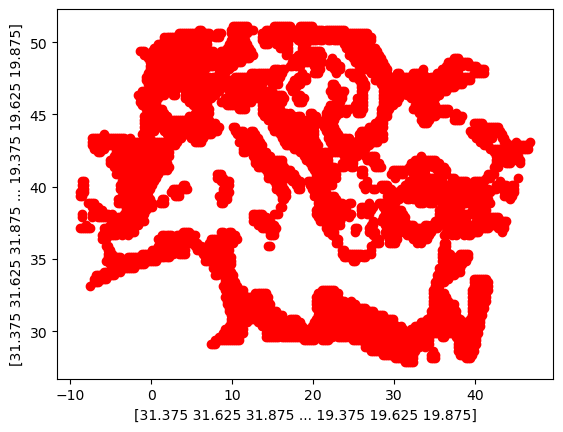

In [222]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [223]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [224]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [225]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [226]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [227]:
Newdf = pd.DataFrame([])

In [228]:
point_list = zip(selected_lat,selected_lon)

In [229]:
ds = xr.open_dataset('Surface_runoff_upscaled.nc')

In [230]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'surface_runoff_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    surface_runoff_values = ds['sro'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'surface_runoff_{i}': val for i, val in zip(range(0, 144), surface_runoff_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('surface_runoff.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1088546233.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

In [231]:
df

,lat,lon,surface_runoff_0,surface_runoff_1,surface_runoff_2,surface_runoff_3,surface_runoff_4,surface_runoff_5,surface_runoff_6,surface_runoff_7,...,surface_runoff_134,surface_runoff_135,surface_runoff_136,surface_runoff_137,surface_runoff_138,surface_runoff_139,surface_runoff_140,surface_runoff_141,surface_runoff_142,surface_runoff_143
0,27.875,31.375,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.491318e-07,0.000000e+00,3.250316e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,27.875,31.625,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.491318e-07,0.000000e+00,3.250316e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,27.875,31.875,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.491318e-07,0.000000e+00,3.250316e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,27.875,32.125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.297332e-06,0.000000e+00,6.491318e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,27.875,32.375,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.622364e-06,3.250316e-07,9.732321e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,0.000017,0.000003,0.000010,0.000010,0.000013,0.000003,0.000009,0.000003,...,1.427066e-05,1.005456e-05,2.854038e-05,0.000014,0.000032,0.000031,0.000014,0.000014,0.000007,0.000013
6198,51.125,19.125,0.000016,0.000003,0.000010,0.000010,0.000013,0.000003,0.000009,0.000003,...,1.524389e-05,1.070276e-05,2.918951e-05,0.000015,0.000030,0.000086,0.000011,0.000012,0.000008,0.000014
6199,51.125,19.375,0.000015,0.000003,0.000010,0.000010,0.000012,0.000003,0.000010,0.000003,...,1.459476e-05,1.167599e-05,2.951361e-05,0.000017,0.000028,0.000094,0.000010,0.000012,0.000008,0.000014
6200,51.125,19.625,0.000015,0.000004,0.000010,0.000011,0.000012,0.000003,0.000010,0.000004,...,1.427066e-05,1.297332e-05,3.016181e-05,0.000019,0.000027,0.000052,0.000009,0.000011,0.000008,0.000015


In [232]:
#======================================================SNOW WATER EQUIVALENT=========================================

In [246]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Snow_depth_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']


In [247]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [248]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [249]:
#selected_lon[selected_lon < 0] += 360

In [250]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


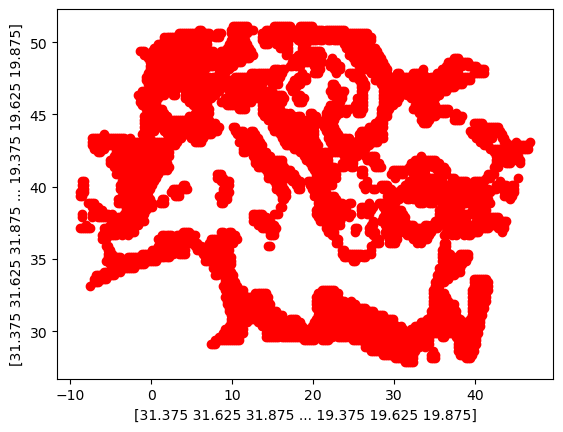

In [251]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [252]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [253]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [254]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [255]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [256]:
Newdf = pd.DataFrame([])

In [257]:
point_list = zip(selected_lat,selected_lon)

In [258]:
ds = xr.open_dataset('Snow_depth_upscaled.nc')

In [259]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'sd_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    sd_values = ds['sd'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'sd_{i}': val for i, val in zip(range(0, 144), sd_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('Snow_water.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3120956725.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)


In [260]:
df

,lat,lon,sd_0,sd_1,sd_2,sd_3,sd_4,sd_5,sd_6,sd_7,...,sd_134,sd_135,sd_136,sd_137,sd_138,sd_139,sd_140,sd_141,sd_142,sd_143
0,27.875,31.375,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,27.875,31.625,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,27.875,31.875,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,27.875,32.125,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,27.875,32.375,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,0.003510,0.008851,0.000763,0.001068,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000305
6198,51.125,19.125,0.003357,0.009308,0.000763,0.001221,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000305
6199,51.125,19.375,0.003204,0.010071,0.001068,0.001373,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000305
6200,51.125,19.625,0.003204,0.010987,0.001221,0.001678,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000458


In [262]:
#SOIL WATER SKIN DEPTH========================================================================================================

In [263]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Soil_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']

In [264]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [265]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [266]:
#selected_lon[selected_lon < 0] += 360

In [267]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


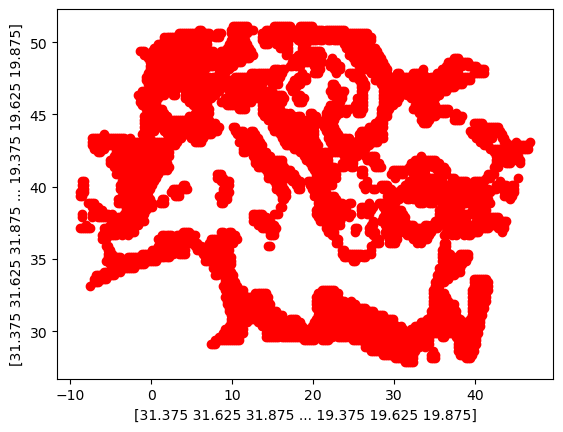

In [268]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [269]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [270]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [271]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [272]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [273]:
Newdf = pd.DataFrame([])

In [274]:
point_list = zip(selected_lat,selected_lon)

In [275]:
ds = xr.open_dataset('Soil_upscaled.nc')

In [276]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'src_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    src_values = ds['src'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'src_{i}': val for i, val in zip(range(0, 144), src_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('Soil_src.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1245705006.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

In [277]:
df

,lat,lon,src_0,src_1,src_2,src_3,src_4,src_5,src_6,src_7,...,src_134,src_135,src_136,src_137,src_138,src_139,src_140,src_141,src_142,src_143
0,27.875,31.375,9.799551e-07,1.020962e-07,1.939479e-07,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,3.062596e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,6.126356e-08,0.000001,0.000004
1,27.875,31.625,1.347420e-06,2.858287e-07,2.756133e-07,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,4.083267e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,2.347806e-07,0.000002,0.000005
2,27.875,31.875,1.990527e-06,7.451745e-07,5.614420e-07,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,3.572786e-07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,6.431073e-07,0.000003,0.000006
3,27.875,32.125,2.204877e-06,9.697396e-07,6.839400e-07,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,2.041634e-07,0.000000,0.000000,0.000000,0.000000,0.000000,4.083267e-08,1.071836e-06,0.000004,0.000007
4,27.875,32.375,1.959910e-06,6.737246e-07,4.185422e-07,1.021544e-08,0.000000,0.000000,0.000000,0.000000,...,7.147901e-08,0.000000,0.000000,0.000000,0.000000,0.000000,4.083267e-08,7.247727e-07,0.000003,0.000006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,8.522431e-05,4.277041e-06,3.169500e-05,5.474404e-05,0.000069,0.000041,0.000076,0.000031,...,4.950748e-05,0.000079,0.000117,0.000086,0.000084,0.000104,7.267902e-05,6.298168e-05,0.000090,0.000111
6198,51.125,19.125,7.797685e-05,4.430156e-06,2.965346e-05,5.182464e-05,0.000070,0.000041,0.000077,0.000032,...,4.771093e-05,0.000074,0.000119,0.000088,0.000084,0.000104,6.706477e-05,6.013372e-05,0.000084,0.000104
6199,51.125,19.375,7.765018e-05,6.420683e-06,3.016385e-05,5.182464e-05,0.000073,0.000042,0.000081,0.000033,...,4.950748e-05,0.000075,0.000127,0.000091,0.000094,0.000108,6.499261e-05,6.175676e-05,0.000081,0.000101
6200,51.125,19.625,7.395499e-05,7.533323e-06,3.043946e-05,5.060993e-05,0.000074,0.000044,0.000084,0.000033,...,4.749658e-05,0.000078,0.000126,0.000093,0.000102,0.000108,6.326751e-05,6.267545e-05,0.000076,0.000098


In [278]:
#SOIL WATER SWLI========================================================================================================

In [279]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Soil_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']

In [280]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [281]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [282]:
#selected_lon[selected_lon < 0] += 360

In [283]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


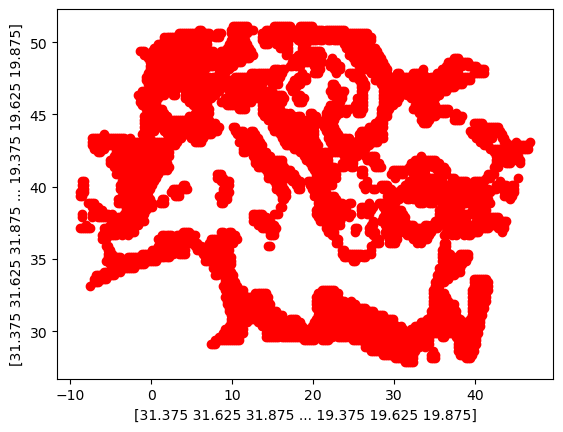

In [284]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [285]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [286]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [287]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [288]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [289]:
Newdf = pd.DataFrame([])

In [290]:
point_list = zip(selected_lat,selected_lon)

In [291]:
ds = xr.open_dataset('Soil_upscaled.nc')

In [292]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'swl1_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    swl1_values = ds['swvl1'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'swl1_{i}': val for i, val in zip(range(0, 144), swl1_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('Soil_swl1.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\220329681.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Tem

In [293]:
df

,lat,lon,swl1_0,swl1_1,swl1_2,swl1_3,swl1_4,swl1_5,swl1_6,swl1_7,...,swl1_134,swl1_135,swl1_136,swl1_137,swl1_138,swl1_139,swl1_140,swl1_141,swl1_142,swl1_143
0,27.875,31.375,0.000034,0.002122,0.002462,0.000738,0.000091,0.000000,0.000000,0.000000,...,0.009849,0.001997,0.004981,0.000000,0.000000,0.000000,0.000000,0.000193,0.000238,0.000000
1,27.875,31.625,0.000034,0.003223,0.003847,0.000987,0.000011,0.000000,0.000000,0.000000,...,0.011381,0.001668,0.005197,0.000000,0.000000,0.000000,0.000000,0.000477,0.000148,0.000000
2,27.875,31.875,0.000068,0.001282,0.001214,0.000374,0.000182,0.000000,0.000000,0.000000,...,0.013174,0.003427,0.005628,0.000000,0.000000,0.000000,0.000000,0.000431,0.000284,0.000000
3,27.875,32.125,0.000647,0.000851,0.002201,0.001952,0.001963,0.000023,0.000000,0.000000,...,0.017939,0.005878,0.006956,0.000102,0.000000,0.000000,0.000000,0.000170,0.000443,0.000023
4,27.875,32.375,0.000477,0.000499,0.001645,0.001362,0.001781,0.000011,0.000000,0.000000,...,0.027153,0.006649,0.008238,0.002451,0.000000,0.000000,0.000000,0.000306,0.000113,0.000023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,0.272017,0.243038,0.244989,0.218880,0.195926,0.106728,0.166549,0.125859,...,0.230931,0.215907,0.237648,0.187484,0.221218,0.249891,0.234936,0.234641,0.240212,0.251990
6198,51.125,19.125,0.271529,0.243344,0.246079,0.220049,0.198002,0.109701,0.163621,0.127470,...,0.233949,0.215170,0.239849,0.187291,0.223249,0.255020,0.230409,0.230556,0.242606,0.252308
6199,51.125,19.375,0.270928,0.243945,0.247077,0.221127,0.197321,0.109781,0.163508,0.132644,...,0.235310,0.216565,0.243469,0.191841,0.226358,0.258015,0.227254,0.227356,0.242141,0.252070
6200,51.125,19.625,0.271541,0.244898,0.248654,0.222239,0.194337,0.109406,0.164302,0.135413,...,0.236638,0.217632,0.245670,0.196221,0.229875,0.261680,0.227118,0.226880,0.241960,0.252660


In [125]:
#SOIL WATER SWL2========================================================================================================

In [294]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Soil_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']

In [295]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [296]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [297]:
#selected_lon[selected_lon < 0] += 360

In [298]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


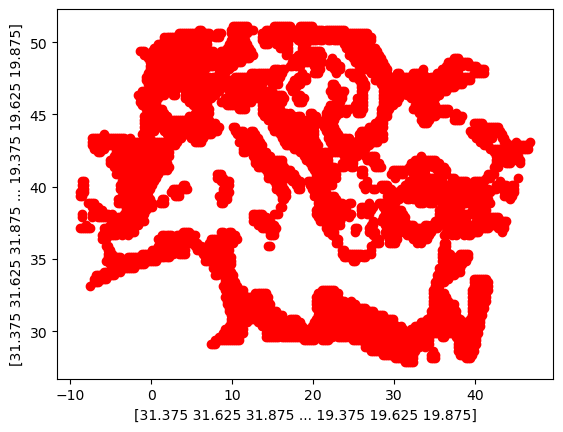

In [299]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [300]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [301]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [302]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [303]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [304]:
Newdf = pd.DataFrame([])

In [305]:
point_list = zip(selected_lat,selected_lon)

In [138]:
ds = xr.open_dataset('Soil_upscaled.nc')

In [306]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'swl2_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    swl2_values = ds['swvl2'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'swl2_{i}': val for i, val in zip(range(0, 144), swl2_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('Soil_swl2.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\3452057403.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

In [307]:
df

,lat,lon,swl2_0,swl2_1,swl2_2,swl2_3,swl2_4,swl2_5,swl2_6,swl2_7,...,swl2_134,swl2_135,swl2_136,swl2_137,swl2_138,swl2_139,swl2_140,swl2_141,swl2_142,swl2_143
0,27.875,31.375,0.000194,0.000216,0.000216,0.000194,0.000034,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,27.875,31.625,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,27.875,31.875,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,27.875,32.125,0.000011,0.000068,0.000023,0.000068,0.000011,0.000000,0.000000,0.000000,...,0.000102,0.000148,0.000034,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,27.875,32.375,0.000000,0.000011,0.000000,0.000011,0.000000,0.000000,0.000000,0.000000,...,0.001458,0.002004,0.001583,0.000501,0.000011,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,0.265245,0.241433,0.248117,0.215526,0.192670,0.093391,0.113935,0.112466,...,0.233040,0.212485,0.232379,0.182581,0.226982,0.245043,0.232789,0.235545,0.240829,0.252058
6198,51.125,19.125,0.264516,0.241342,0.248960,0.216824,0.194857,0.096124,0.107023,0.116668,...,0.236525,0.212986,0.234589,0.185678,0.229692,0.250680,0.229100,0.231036,0.243710,0.252547
6199,51.125,19.375,0.263628,0.242025,0.250031,0.218304,0.193057,0.096102,0.104176,0.123045,...,0.237880,0.214649,0.237811,0.192169,0.231958,0.253925,0.226629,0.227221,0.243335,0.252297
6200,51.125,19.625,0.263821,0.242503,0.251534,0.220149,0.190062,0.095441,0.103492,0.127896,...,0.239315,0.216175,0.240522,0.198763,0.234600,0.258640,0.227665,0.226754,0.243540,0.253003


In [321]:
#SOIL WATER SWL3========================================================================================================

In [322]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Soil_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']

In [323]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [324]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [325]:
#selected_lon[selected_lon < 0] += 360

In [326]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


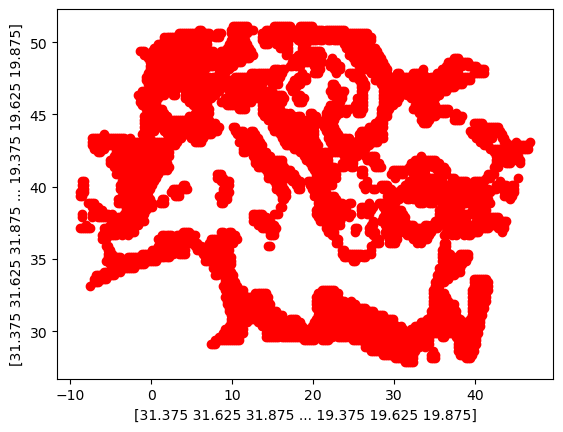

In [327]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [328]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [329]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [330]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [331]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [332]:
Newdf = pd.DataFrame([])

In [333]:
point_list = zip(selected_lat,selected_lon)

In [334]:
ds = xr.open_dataset('Soil_upscaled.nc')

In [335]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'swl3_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    swl3_values = ds['swvl3'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'swl3_{i}': val for i, val in zip(range(0, 144), swl3_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('Soil_swl3.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\1074012674.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

In [336]:
df

,lat,lon,swl3_0,swl3_1,swl3_2,swl3_3,swl3_4,swl3_5,swl3_6,swl3_7,...,swl3_134,swl3_135,swl3_136,swl3_137,swl3_138,swl3_139,swl3_140,swl3_141,swl3_142,swl3_143
0,27.875,31.375,0.056013,0.055615,0.055432,0.054966,0.053690,0.052039,0.050308,0.048668,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,27.875,31.625,0.000102,0.000091,0.000091,0.000080,0.000046,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,27.875,31.875,0.005318,0.005249,0.005158,0.005067,0.004828,0.004475,0.004065,0.003667,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,27.875,32.125,0.074825,0.074506,0.074039,0.073675,0.072752,0.071056,0.068755,0.066569,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,27.875,32.375,0.050661,0.050331,0.049887,0.049477,0.048566,0.047120,0.045093,0.043146,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,0.253021,0.253579,0.250300,0.230612,0.193023,0.146848,0.115260,0.098920,...,0.235611,0.226228,0.219885,0.207826,0.200037,0.220762,0.222777,0.223688,0.236214,0.244481
6198,51.125,19.125,0.252065,0.252760,0.250414,0.232229,0.195198,0.149239,0.116524,0.100309,...,0.240143,0.229701,0.223119,0.211686,0.201426,0.225021,0.228209,0.221787,0.237182,0.246280
6199,51.125,19.375,0.248808,0.250482,0.249617,0.234199,0.196872,0.149513,0.116240,0.101277,...,0.242773,0.230464,0.226057,0.216264,0.205514,0.227446,0.231557,0.220318,0.235713,0.245916
6200,51.125,19.625,0.247806,0.249810,0.250061,0.236590,0.198568,0.149444,0.115932,0.102507,...,0.246258,0.231431,0.229086,0.220762,0.211094,0.233242,0.237011,0.222424,0.236225,0.247237


In [337]:
#SOIL WATER SWL4========================================================================================================

In [338]:
# Open the netCDF file and get the latitude and longitude variables
nc_file = netCDF4.Dataset('Soil_upscaled.nc')
lat_var = nc_file.variables['lat']
lon_var = nc_file.variables['lon']

In [339]:
# Load the latitude and longitude values into numpy arrays
lat_values = lat_var[:]
lon_values = lon_var[:]

In [340]:
# Load the selected latitude and longitude values from the dataframe
df = pd.read_csv('data.csv', header=None)
selected_lat = df[0][:].values
selected_lon = df[1][:].values

In [341]:
#selected_lon[selected_lon < 0] += 360

In [342]:
selected_lon

array([31.375, 31.625, 31.875, ..., 19.375, 19.625, 19.875])

C:\Users\emman\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


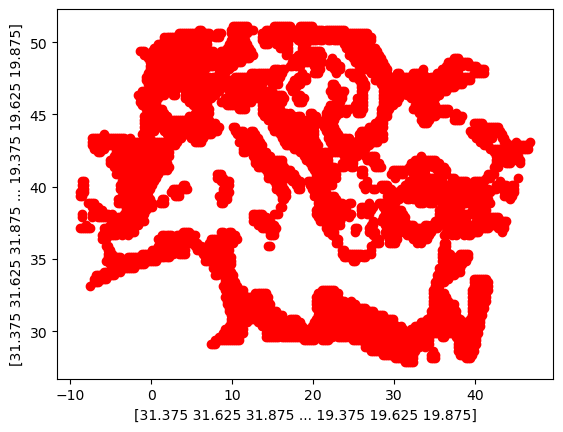

In [343]:
plt.plot(selected_lon, selected_lat, 'ro')
plt.xlabel(selected_lon)
plt.ylabel(selected_lon)
plt.show()

In [344]:
# Find the indices of the latitude and longitude values that are closest to the selected values
lat_idx = np.abs(lat_values - selected_lat[:, np.newaxis]).argmin(axis=1)
lon_idx = np.abs(lon_values - selected_lon[:, np.newaxis]).argmin(axis=1)

In [345]:
lat_idx

array([471, 471, 471, ..., 564, 564, 564], dtype=int64)

In [346]:
lon_idx

array([845, 846, 847, ..., 797, 798, 799], dtype=int64)

In [347]:
 #Create a new dataframe with the index values
#new_df = pd.DataFrame({'latitude_index': lat_idx, 'longitude_index': lon_idx})

In [348]:
Newdf = pd.DataFrame([])

In [349]:
point_list = zip(selected_lat,selected_lon)

In [350]:
ds = xr.open_dataset('Soil_upscaled.nc')

In [351]:
# Define the latitude and longitude index points
lat_indexes = lat_idx  # Replace with your latitude index points
lon_indexes = lon_idx  # Replace with your longitude index points

# Create an empty DataFrame to store the extracted data
columns = ['lat', 'lon'] + [f'swl4_{i}' for i in range(0, 144)]
df = pd.DataFrame(columns=columns)

# Iterate over the specified lat and lon index pairs
for lat_idx, lon_idx in zip(lat_indexes, lon_indexes):
    lat = ds['lat'][lat_idx].values
    lon = ds['lon'][lon_idx].values

    # Extract lwe_thickness for the specified indexes and lat-lon pair
    swl4_values = ds['swvl4'][0:144, lat_idx, lon_idx].values

    # Store the extracted data in the DataFrame
    data = {'lat': lat, 'lon': lon, **{f'swl4_{i}': val for i, val in zip(range(0, 144), swl4_values)}}
    df = df.append(data, ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('Soil_swl4.csv', index=False)

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local

C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)
C:\Users\emman\AppData\Local\Temp\ipykernel_11568\2734488169.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(data, ignore_index=True)


In [352]:
df

,lat,lon,swl4_0,swl4_1,swl4_2,swl4_3,swl4_4,swl4_5,swl4_6,swl4_7,...,swl4_134,swl4_135,swl4_136,swl4_137,swl4_138,swl4_139,swl4_140,swl4_141,swl4_142,swl4_143
0,27.875,31.375,0.043515,0.043481,0.043481,0.043447,0.043332,0.043160,0.042954,0.042759,...,0.014410,0.014375,0.014249,0.013963,0.013527,0.013091,0.012724,0.012461,0.012266,0.012128
1,27.875,31.625,0.004024,0.003921,0.003909,0.003840,0.003565,0.003336,0.003118,0.002946,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,27.875,31.875,0.014387,0.014284,0.014203,0.014066,0.013699,0.013240,0.012828,0.012484,...,0.000149,0.000149,0.000149,0.000149,0.000138,0.000126,0.000126,0.000115,0.000115,0.000115
3,27.875,32.125,0.050233,0.050222,0.050222,0.050222,0.050210,0.050187,0.050164,0.050130,...,0.018514,0.018514,0.018479,0.018147,0.017459,0.016794,0.016221,0.015774,0.015441,0.015235
4,27.875,32.375,0.057409,0.057386,0.057363,0.057340,0.057260,0.057100,0.056893,0.056687,...,0.014364,0.014364,0.014364,0.014261,0.013676,0.013045,0.012553,0.012197,0.011899,0.011681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6197,51.125,18.875,0.227493,0.237466,0.241570,0.242567,0.238372,0.230416,0.221302,0.212888,...,0.230599,0.230989,0.229121,0.227046,0.223079,0.221257,0.221681,0.221646,0.224088,0.227653
6198,51.125,19.125,0.227642,0.237088,0.241192,0.242487,0.238578,0.230920,0.221910,0.213576,...,0.233649,0.234634,0.232777,0.230829,0.226782,0.224673,0.225647,0.225154,0.226702,0.230324
6199,51.125,19.375,0.223950,0.232903,0.237535,0.239633,0.236239,0.228937,0.220202,0.212223,...,0.235895,0.236778,0.234841,0.233075,0.229143,0.226897,0.228169,0.227458,0.228100,0.231150
6200,51.125,19.625,0.222437,0.231379,0.236354,0.239117,0.236102,0.228949,0.220271,0.212487,...,0.240676,0.241100,0.238933,0.237179,0.233339,0.231299,0.233580,0.232777,0.232697,0.234967
